<a href="https://colab.research.google.com/github/SarkarPriyanshu/DataScienceAssign/blob/main/ResoluteAI_Task_1_Clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [69]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

import scipy.stats as stats
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.manifold import TSNE

from sklearn.cluster import KMeans

plt.style.use('ggplot')
import warnings
warnings.filterwarnings('ignore')

In [78]:
pd.read_excel('/content/gdrive/MyDrive/DataSets/Task1and2/train.xlsx')['target'].value_counts()

A39    635
A33    633
A29    432
A3     429
B45    428
      ... 
A27    191
B65    191
A69    190
A18    189
A9     188
Name: target, Length: 160, dtype: int64

In [3]:
df = pd.read_excel('/content/gdrive/MyDrive/DataSets/Task1and2/test.xlsx')

In [4]:
df.shape

(15752, 18)

In [5]:
df.sample(5)

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18
14582,-68,-61,-50,-68,-67,-60,-70,-80,-75,-53,-50,-57,-71,-76,-65,-70,-75,-74
6210,-56,-61,-64,-71,-68,-68,-77,-81,-72,-56,-56,-57,-61,-74,-67,-72,-82,-75
14111,-63,-69,-63,-62,-64,-61,-64,-63,-76,-69,-71,-63,-66,-58,-50,-57,-59,-64
10226,-42,-59,-73,-70,-81,-72,-74,-82,-82,-59,-67,-67,-66,-82,-87,-70,-84,-74
12551,-73,-67,-72,-72,-70,-62,-70,-62,-58,-64,-73,-72,-72,-79,-67,-58,-78,-50


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15752 entries, 0 to 15751
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   T1      15752 non-null  int64
 1   T2      15752 non-null  int64
 2   T3      15752 non-null  int64
 3   T4      15752 non-null  int64
 4   T5      15752 non-null  int64
 5   T6      15752 non-null  int64
 6   T7      15752 non-null  int64
 7   T8      15752 non-null  int64
 8   T9      15752 non-null  int64
 9   T10     15752 non-null  int64
 10  T11     15752 non-null  int64
 11  T12     15752 non-null  int64
 12  T13     15752 non-null  int64
 13  T14     15752 non-null  int64
 14  T15     15752 non-null  int64
 15  T16     15752 non-null  int64
 16  T17     15752 non-null  int64
 17  T18     15752 non-null  int64
dtypes: int64(18)
memory usage: 2.2 MB


In [7]:
df.describe() \
.T \
.style \
.background_gradient('crest',axis=0)

,count,mean,std,min,25%,50%,75%,max
T1,15752.000000,-65.871191,8.756142,-95.000000,-72.000000,-66.000000,-61.000000,-41.000000
T2,15752.000000,-64.506539,9.016451,-95.000000,-70.000000,-65.000000,-58.000000,-36.000000
T3,15752.000000,-64.514030,8.175667,-95.000000,-70.000000,-64.000000,-59.000000,-42.000000
T4,15752.000000,-65.255523,8.179889,-95.000000,-70.000000,-66.000000,-61.000000,-41.000000
T5,15752.000000,-64.557770,8.056777,-95.000000,-69.000000,-65.000000,-60.000000,-32.000000
T6,15752.000000,-63.273680,8.589670,-95.000000,-69.000000,-63.000000,-57.000000,-39.000000
T7,15752.000000,-67.047169,9.160641,-95.000000,-74.000000,-66.000000,-60.000000,-46.000000
T8,15752.000000,-66.730637,10.190709,-95.000000,-75.000000,-66.000000,-59.000000,-40.000000
T9,15752.000000,-65.725114,10.519560,-95.000000,-73.000000,-65.000000,-59.000000,-39.000000
T10,15752.000000,-65.526981,10.443959,-95.000000,-73.000000,-65.000000,-58.000000,-41.000000


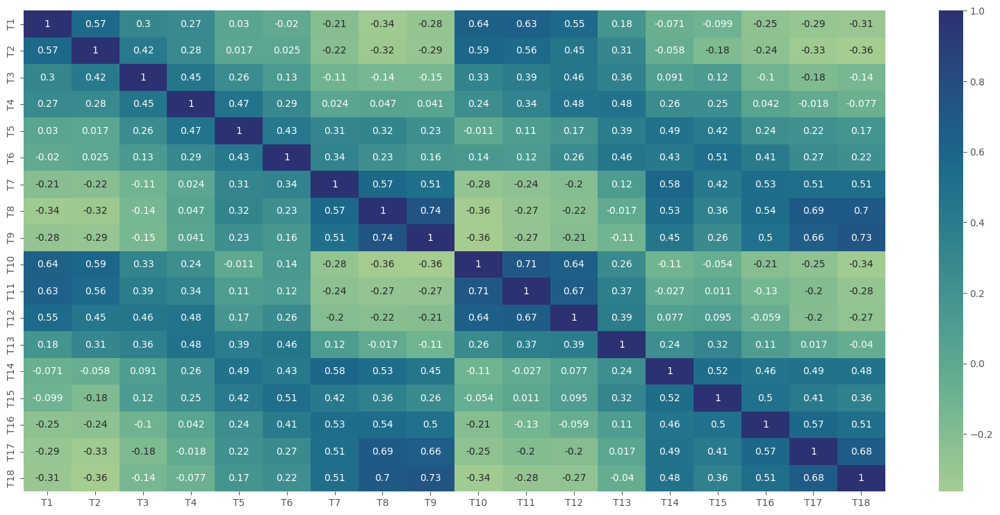

In [8]:
plt.figure(figsize=(20,9))
sns.heatmap(df.corr(),annot=True,cmap="crest")
plt.show()

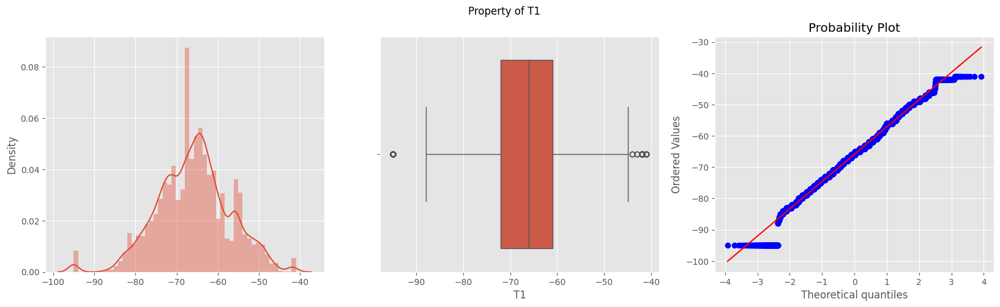

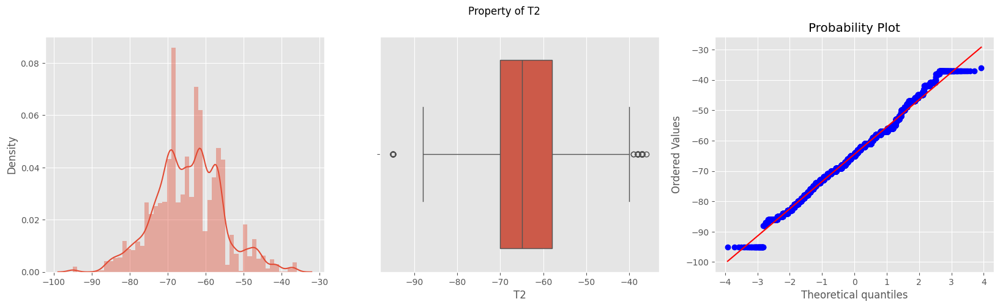

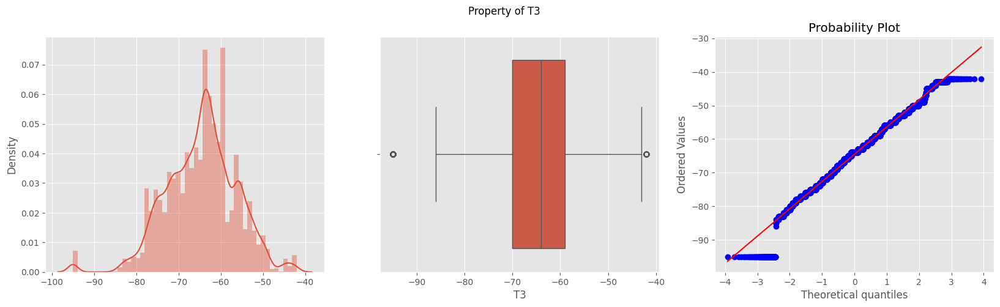

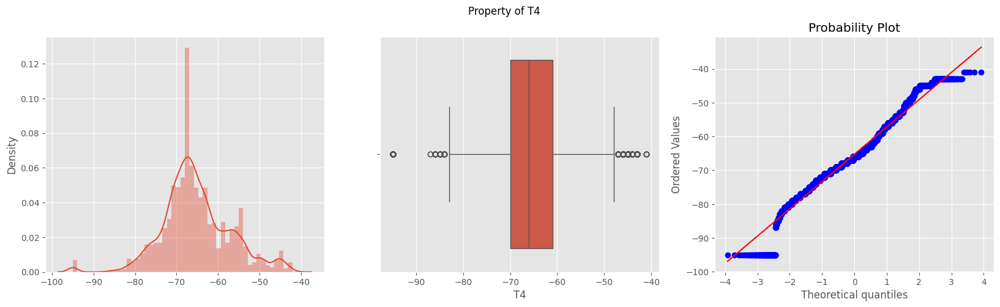

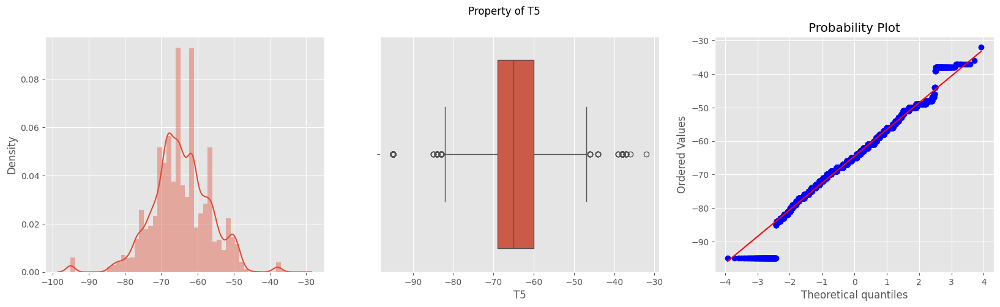

...

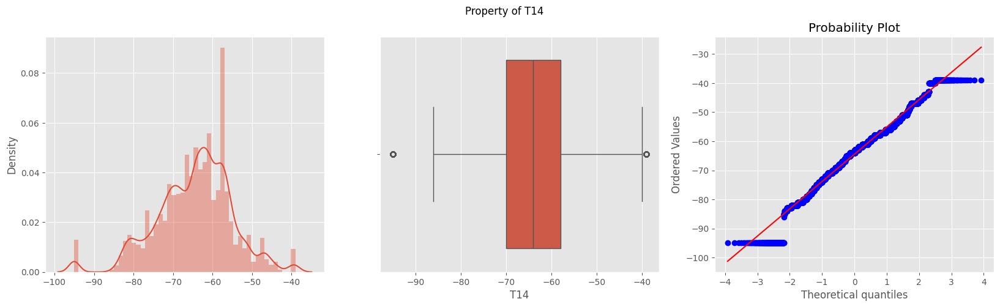

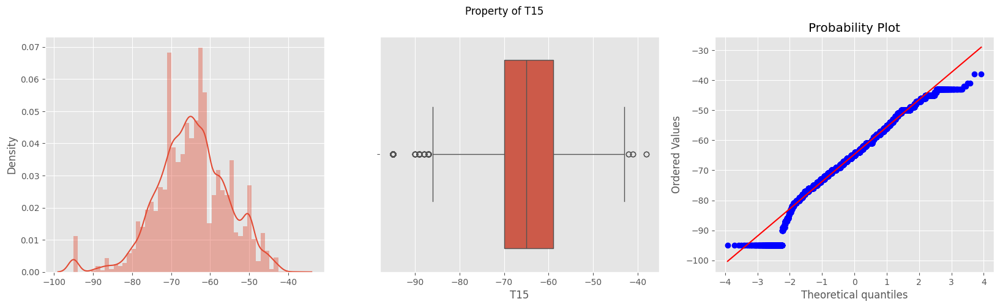

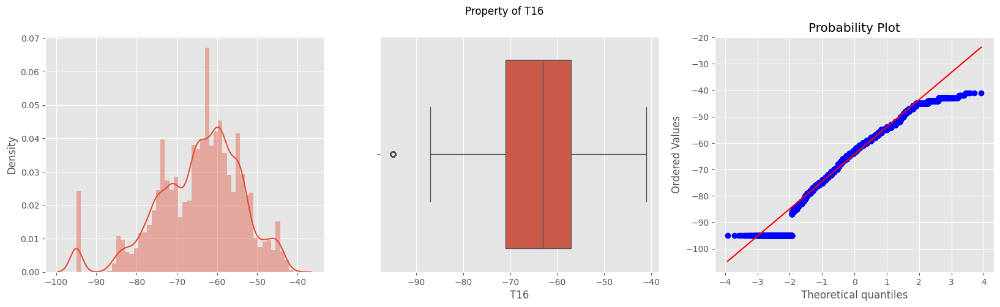

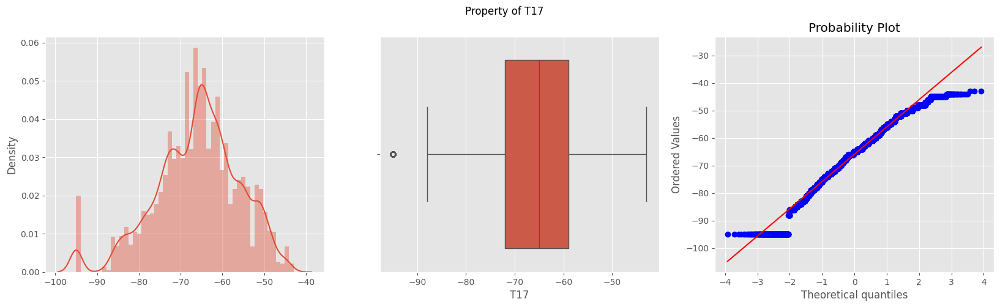

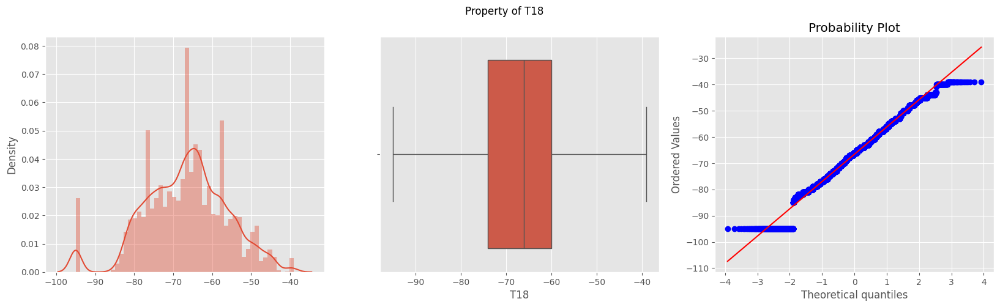

In [9]:
# Loop through each column in the DataFrame
for feature in df.columns:
    # Create subplots with 1 row and 3 columns, and set the figure size
    fig, ax = plt.subplots(1, 3, figsize=(20, 5))

    # Add a title to the entire figure
    fig.suptitle(f'Property of {feature}')

    # Plot a distribution plot on the first subplot
    sns.distplot(x=df[feature], ax=ax[0])

    # Plot a box plot on the second subplot
    sns.boxplot(data=df, x=df[feature], ax=ax[1])

    # Plot a probability plot on the third subplot
    stats.probplot(df[feature], plot=ax[2])

    # Display the figure
    plt.show()

    # Print a newline for spacing
    print()


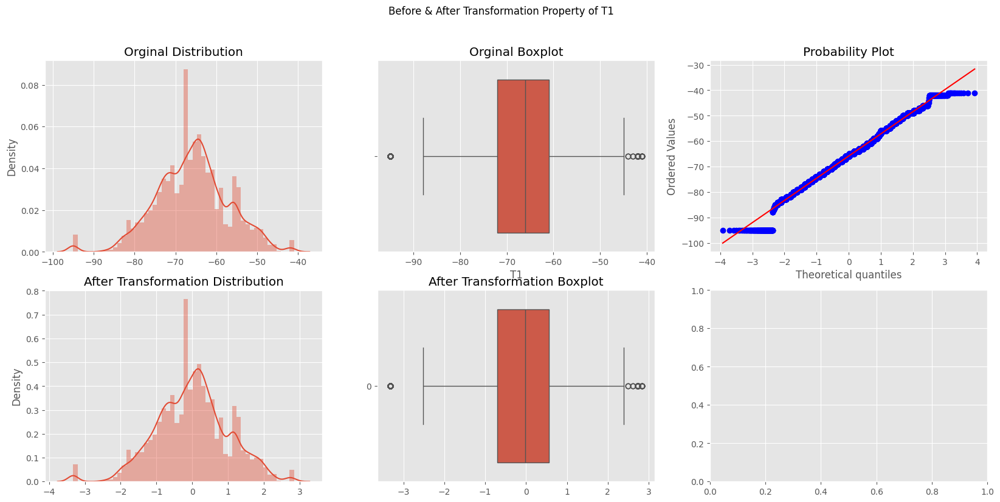

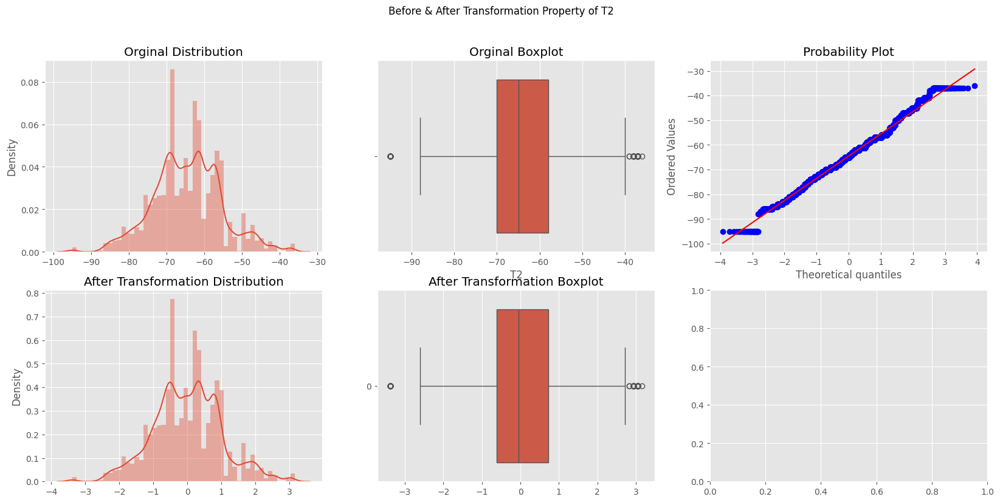

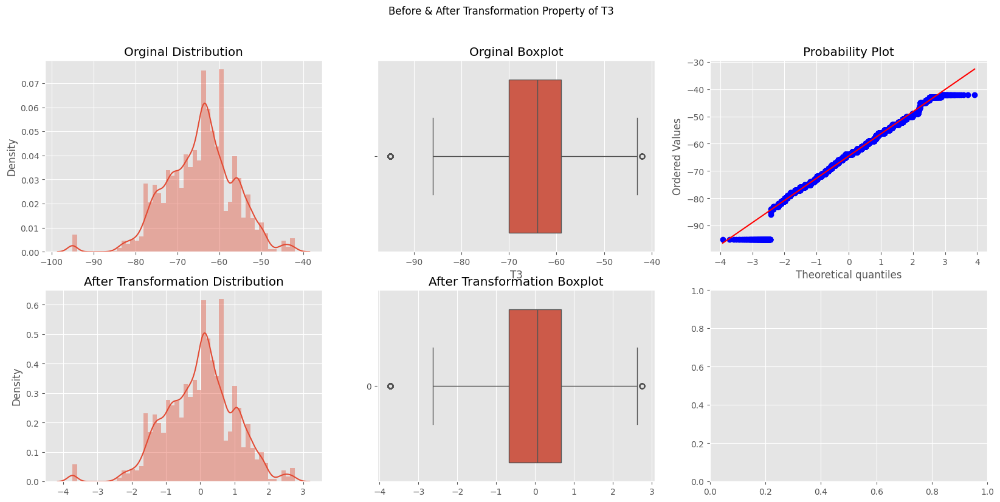

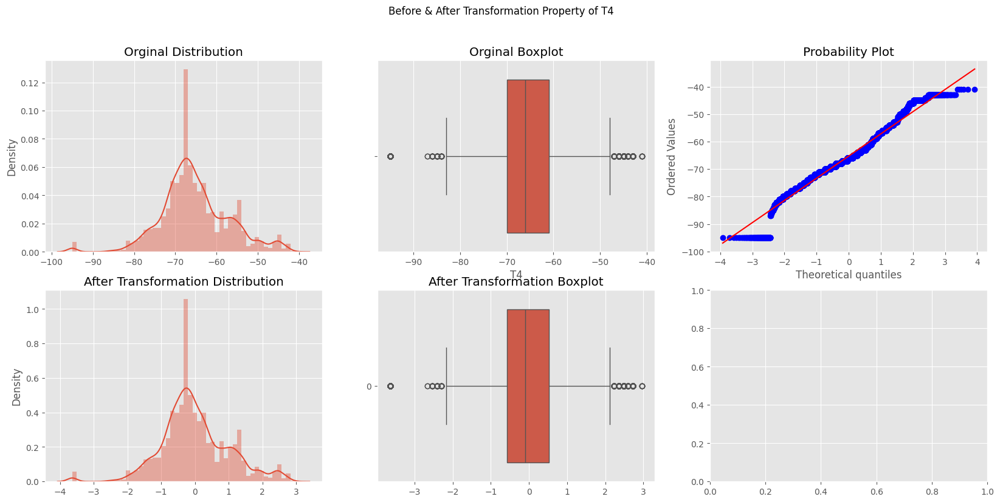

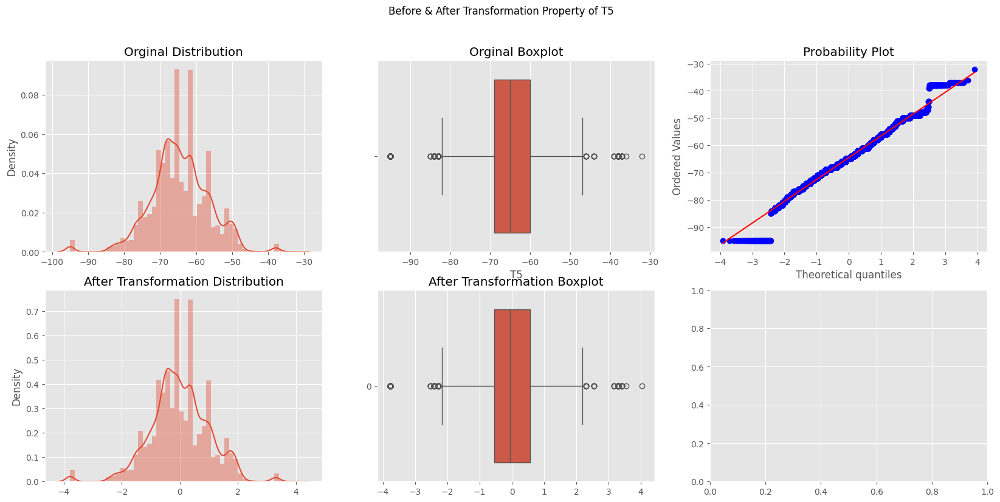

...

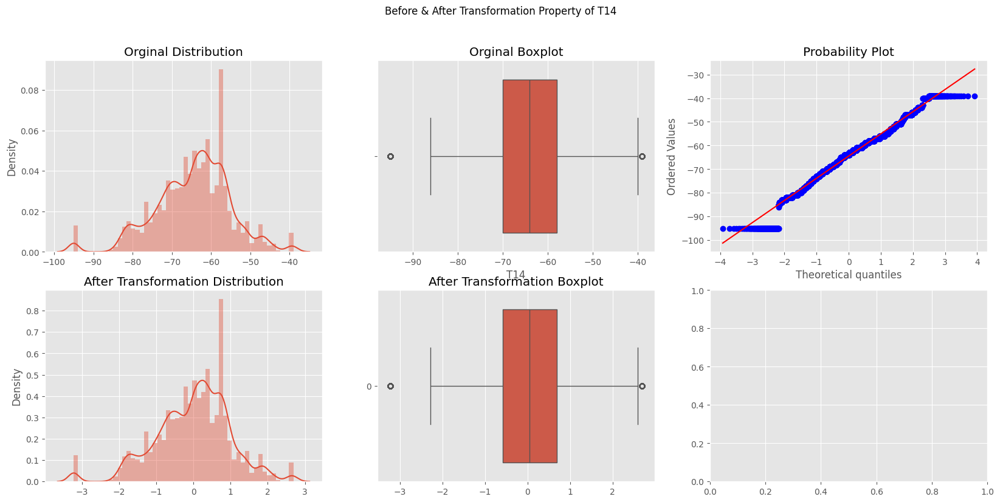

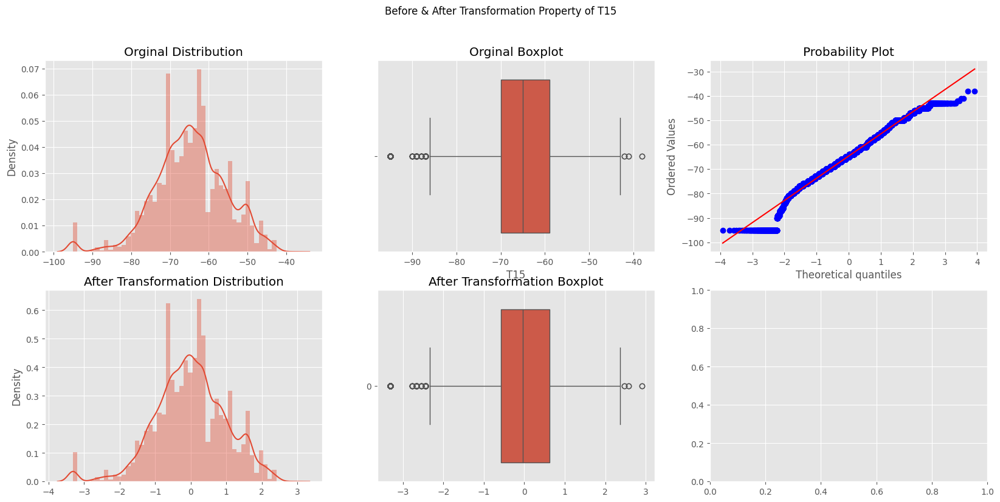

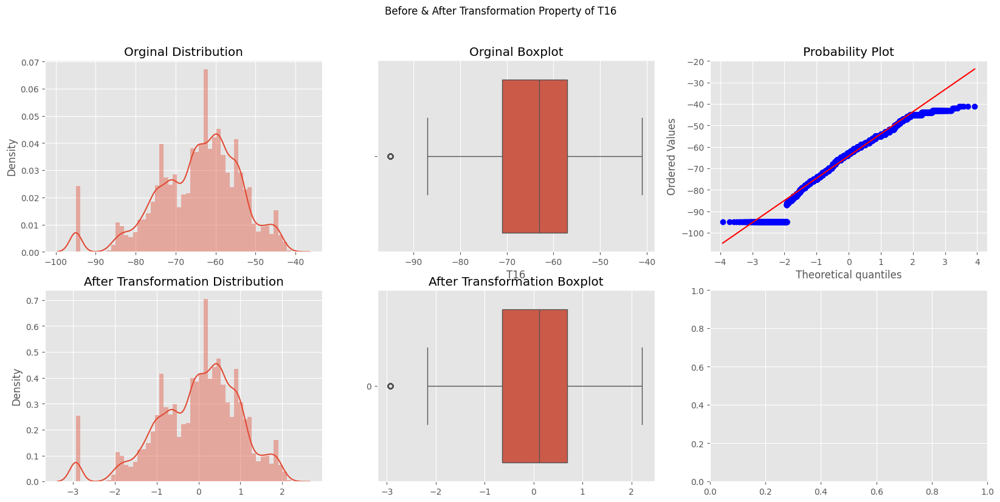

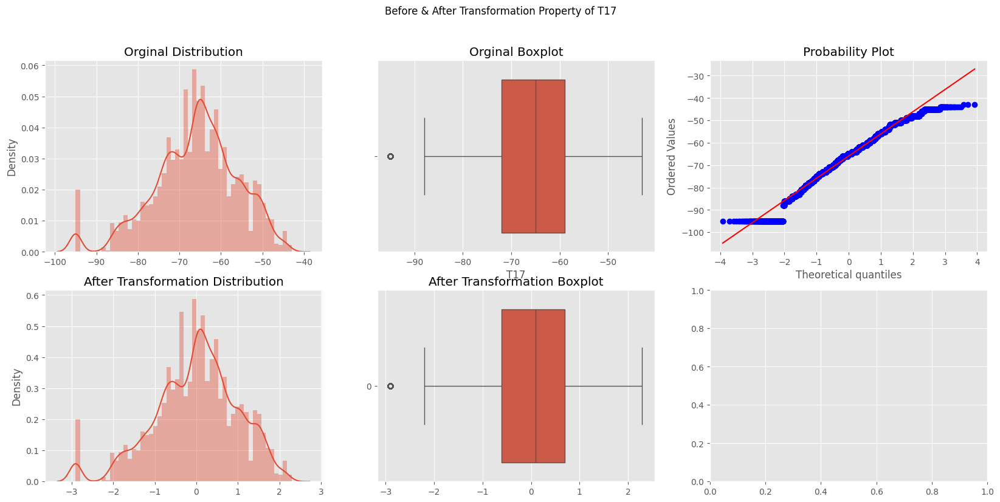

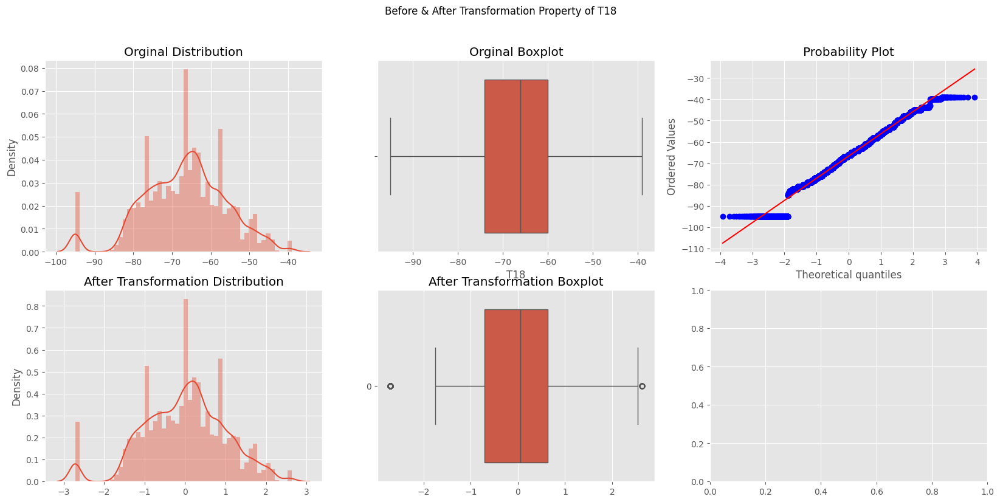

In [10]:
# Create a StandardScaler object
stdscalar = StandardScaler()

# Loop through each column in the DataFrame
for feature in df.columns:
    # Create subplots with 2 rows and 3 columns, and set the figure size
    fig, ax = plt.subplots(2, 3, figsize=(20, 9))

    # Add a title to the entire figure
    fig.suptitle(f'Before & After Transformation Property of {feature}')

    # Plot the original distribution on the first subplot of the first row
    ax[0][0].set_title('Original Distribution')
    sns.distplot(x=df[feature], ax=ax[0][0])

    # Plot the original boxplot on the second subplot of the first row
    ax[0][1].set_title('Original Boxplot')
    sns.boxplot(data=df, x=df[feature], ax=ax[0][1])

    # Plot the original probability plot on the third subplot of the first row
    stats.probplot(df[feature], plot=ax[0][2])

    # Transform the data using StandardScaler
    data = stdscalar.fit_transform(df[[feature]])

    # Plot the transformed distribution on the first subplot of the second row
    ax[1][0].set_title('After Transformation Distribution')
    sns.distplot(x=data, ax=ax[1][0])

    # Plot the transformed boxplot on the second subplot of the second row
    ax[1][1].set_title('After Transformation Boxplot')
    sns.boxplot(data, ax=ax[1][1], orient='h')

    # stats.probplot(data, plot=ax[1][2]) # This line is commented out because it's not being used

    # Display the figure
    plt.show()

    # Print a newline for spacing
    print()


## Plan of Action to Develop Clustering Program

- Find the best k value (We use Elbow Method)
- Evaluate the K values (We use silhouette_samples, silhouette_score)
  - Using visualization we are gonna decide which k value suited best for given dataset
- Train the model on selected k value on given dataset

#### Sources:
- [How to Determine the Optimal K for K-Means](https://medium.com/analytics-vidhya/how-to-determine-the-optimal-k-for-k-means-708505d204eb)
- [K-Means Clustering - Neptune.ai Blog](https://neptune.ai/blog/k-means-clustering)
- [Scikit-Learn Documentation: Plot KMeans Silhouette Analysis](https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html)
- [YouTube Video: Determining the Optimal K for K-Means Clustering](https://www.youtube.com/watch?v=85XaciPBCkw&t=104s)


In [11]:
scaled_df = stdscalar.fit_transform(df)

In [13]:
print(help(KMeans))

Help on class KMeans in module sklearn.cluster._kmeans:

class KMeans(_BaseKMeans)
 |  KMeans(n_clusters=8, *, init='k-means++', n_init='warn', max_iter=300, tol=0.0001, verbose=0, random_state=None, copy_x=True, algorithm='lloyd')
 |  
 |  K-Means clustering.
 |  
 |  Read more in the :ref:`User Guide <k_means>`.
 |  
 |  Parameters
 |  ----------
 |  
 |  n_clusters : int, default=8
 |      The number of clusters to form as well as the number of
 |      centroids to generate.
 |  
 |  init : {'k-means++', 'random'}, callable or array-like of shape             (n_clusters, n_features), default='k-means++'
 |      Method for initialization:
 |  
 |      'k-means++' : selects initial cluster centroids using sampling based on
 |      an empirical probability distribution of the points' contribution to the
 |      overall inertia. This technique speeds up convergence. The algorithm
 |      implemented is "greedy k-means++". It differs from the vanilla k-means++
 |      by making several t

### Find the best k value (We use Elbow Method)

In [30]:
# Initialize an empty list to store the sum of squared distances (SSD) results
ssd_results = []

# Generate a list of values for k (number of clusters) ranging from 2 to 249
k_values = list(range(2, 250))

# Initialize an empty list to store silhouette scores
sil = []

# Iterate over each value of k
for k in k_values:
    # Create a KMeans model with k clusters
    model = KMeans(n_clusters=k)

    # Fit the model to the scaled data
    model.fit(scaled_df)

    # Append the sum of squared distances (SSD) to the ssd_results list
    ssd_results.append(model.inertia_)

    # Get the cluster labels for each data point
    labels = model.labels_

    # Calculate the silhouette score for the current clustering
    sil.append(silhouette_score(scaled_df, labels, metric='euclidean'))


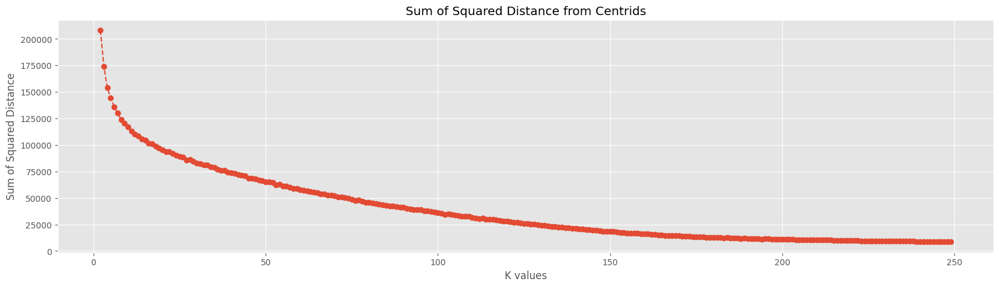

In [31]:
# Create a figure and axis objects
fig, ax = plt.subplots(figsize=(20, 5))

# Set the title of the plot
ax.set_title('Sum of Squared Distance from Centroids')

# Plot the sum of squared distances against the values of k
ax.plot(k_values, ssd_results, 'o--')

# Set the label for the x-axis
ax.set_xlabel('K values')

# Set the label for the y-axis
ax.set_ylabel('Sum of Squared Distance')

# Display the plot
plt.show()


### Evaluate the K values (We use silhouette_samples, silhouette_score)

### Silhouette Score

The silhouette score is a metric used to evaluate the quality of clusters produced by a clustering algorithm. It measures how similar an object is to its own cluster compared to other clusters. The silhouette score ranges from -1 to 1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

#### Formula:

The silhouette score \(s\) for a single sample is calculated using the following formula:

\[ s = \frac{b - a}{max(a, b)} \]

Where:
- \( a \) is the mean distance between a sample and all other points in the same class (intra-cluster distance).
- \( b \) is the mean distance between a sample and all other points in the nearest cluster that the sample is not a part of (nearest-cluster distance).

#### Interpretation:

- A silhouette score close to +1 indicates that the sample is far away from the neighboring clusters.
- A silhouette score close to 0 indicates that the sample is close to the decision boundary between two neighboring clusters.
- A silhouette score close to -1 indicates that the sample may have been assigned to the wrong cluster.

#### Usage:

```python
from sklearn.metrics import silhouette_score

# silhouette_score(X, labels, metric='euclidean', sample_size=None, random_state=None)
# X: array-like, shape (n_samples, n_features)
# labels: Predicted labels for each sample
# metric: The distance metric to use (default is 'euclidean')
# sample_size: The size of the sample to use when computing the silhouette score (optional)
# random_state: The seed used by the random number generator (optional)

silhouette_avg = silhouette_score(X, labels)
print("Silhouette Score:", silhouette_avg)


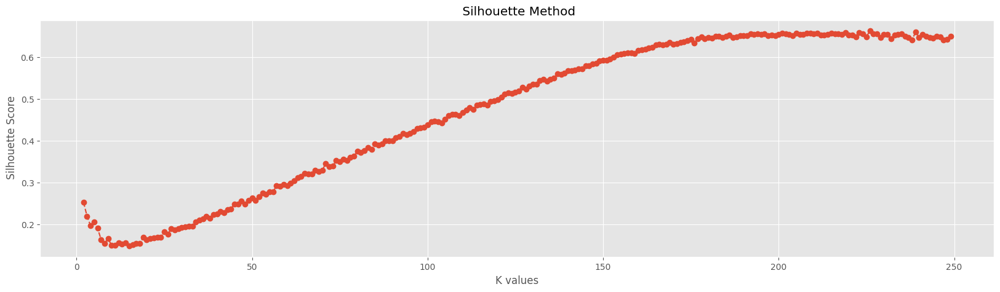

In [32]:
# Create a figure and axis objects
fig, ax = plt.subplots(figsize=(20, 5))

# Set the title of the plot
ax.set_title('Silhouette Method')

# Plot the silhouette scores against the values of k
ax.plot(k_values, sil, 'o--')

# Set the label for the x-axis
ax.set_xlabel('K values')

# Set the label for the y-axis
ax.set_ylabel('Silhouette Score')

# Display the plot
plt.show()


In [58]:
# Create a Pandas Series from the silhouette scores
Sil_Series = pd.Series(sil)

# Assign the values of k as the index of the series
Sil_Series.index = k_values

# Sort the series in descending order based on silhouette scores
Sorted_Sil_Series = Sil_Series.sort_values(ascending=False)

# Select the top 30 silhouette scores
Top_Sil_Values = Sorted_Sil_Series.iloc[:30]


Text(0, 0.5, 'Silhouette Score')

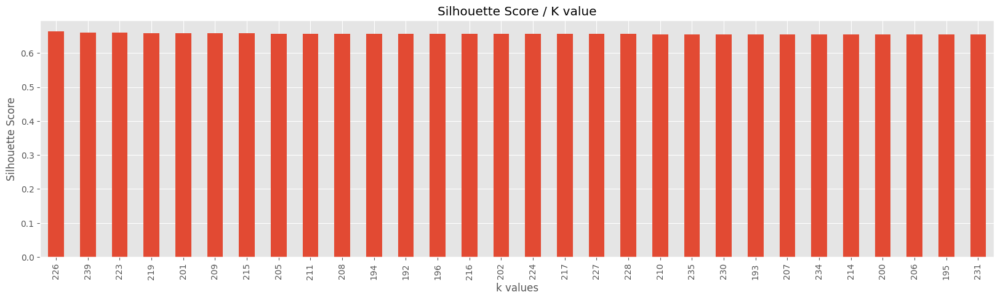

In [60]:
# Create a figure with a specified size
plt.figure(figsize=(20, 5))

# Plot the top 30 silhouette scores as a bar plot
Top_Sil_Values.plot(kind='bar')

# Set the title of the plot
plt.title('Silhouette Score / K value')

# Set the label for the x-axis
plt.xlabel('K values')

# Set the label for the y-axis
plt.ylabel('Silhouette Score')

# Display the plot
plt.show()


### Using visualization we are gonna decide which k value suited best for given dataset

For n_clusters = 194 The average silhouette_score is : 0.6555683040346948
For n_clusters = 192 The average silhouette_score is : 0.6494437538680589
For n_clusters = 196 The average silhouette_score is : 0.653942539606182
For n_clusters = 216 The average silhouette_score is : 0.6494425373386579
For n_clusters = 202 The average silhouette_score is : 0.6549833813779291
For n_clusters = 224 The average silhouette_score is : 0.6590312639644841
For n_clusters = 217 The average silhouette_score is : 0.6575161956634551
For n_clusters = 227 The average silhouette_score is : 0.6549151577372373
For n_clusters = 228 The average silhouette_score is : 0.6539823877655137
For n_clusters = 210 The average silhouette_score is : 0.6547587199259084


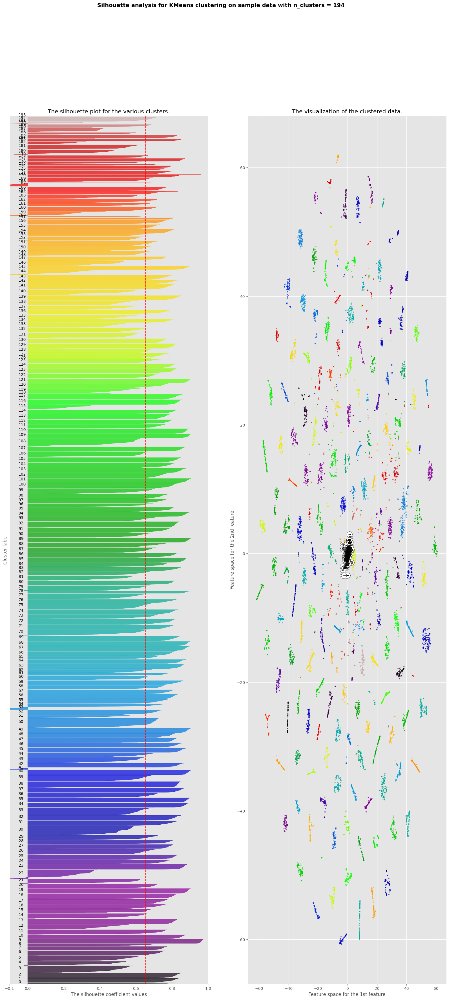

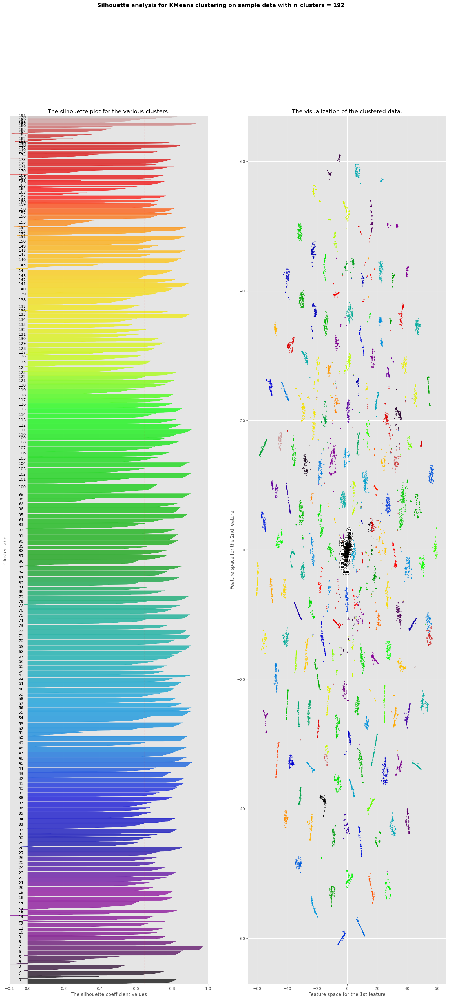

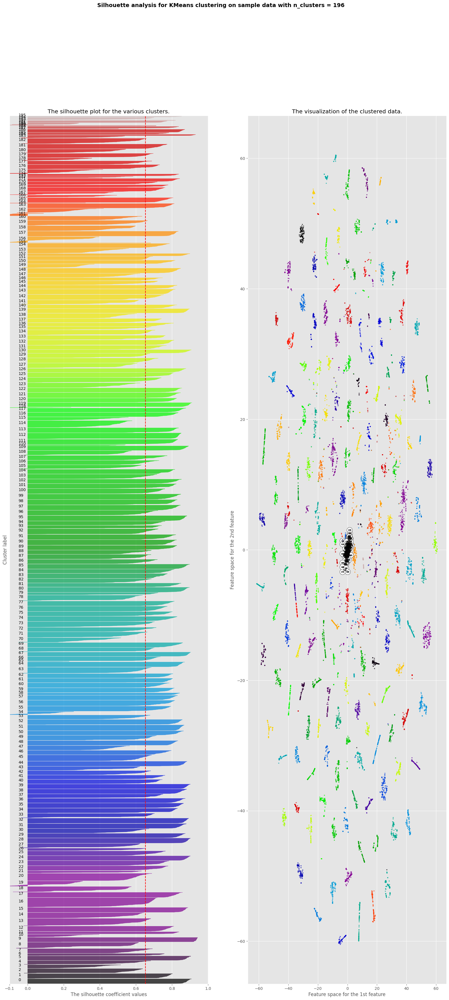

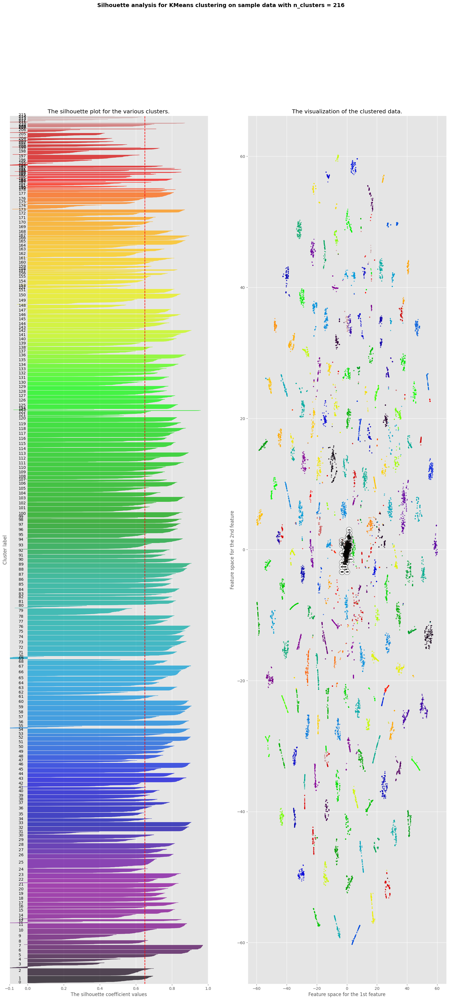

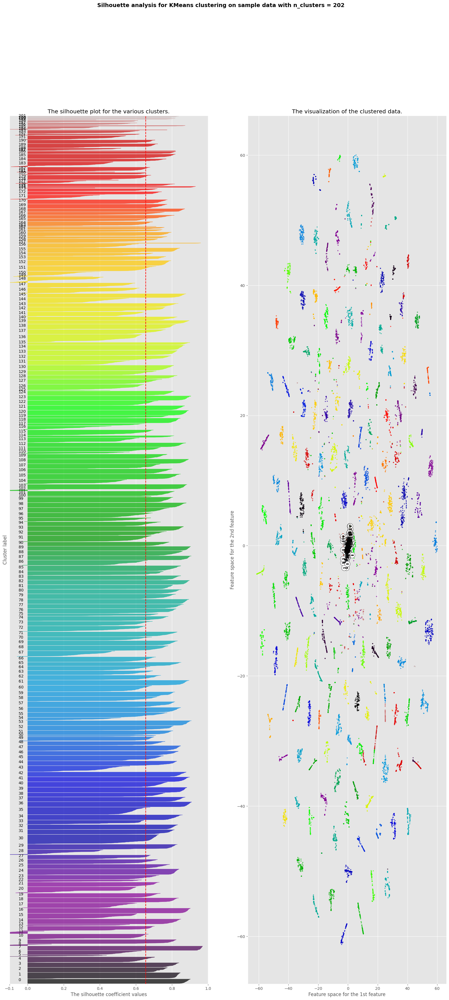

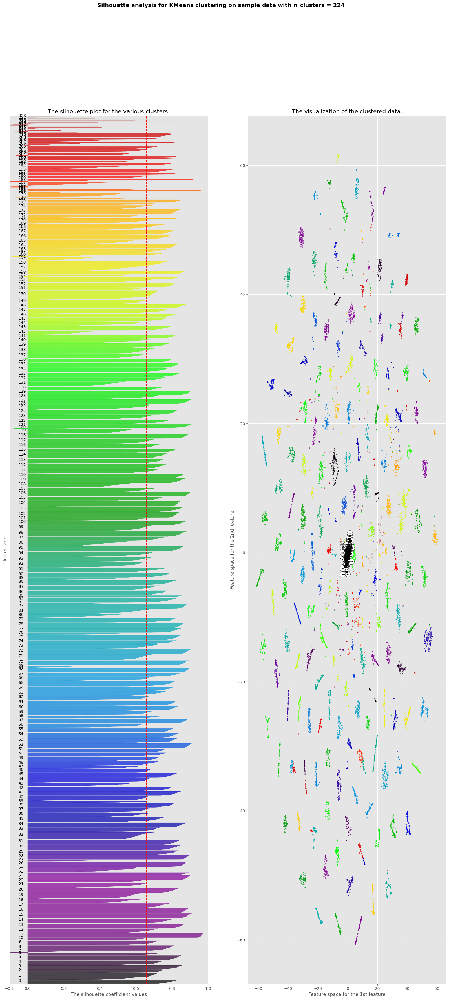

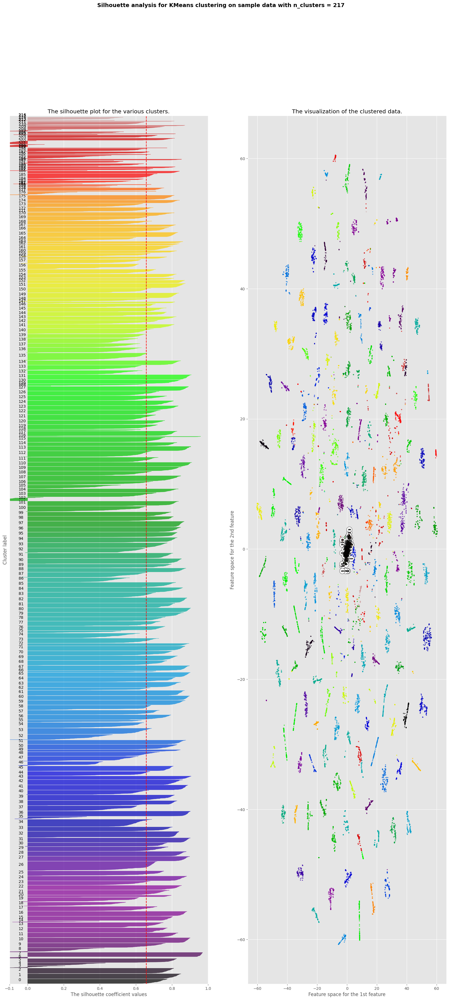

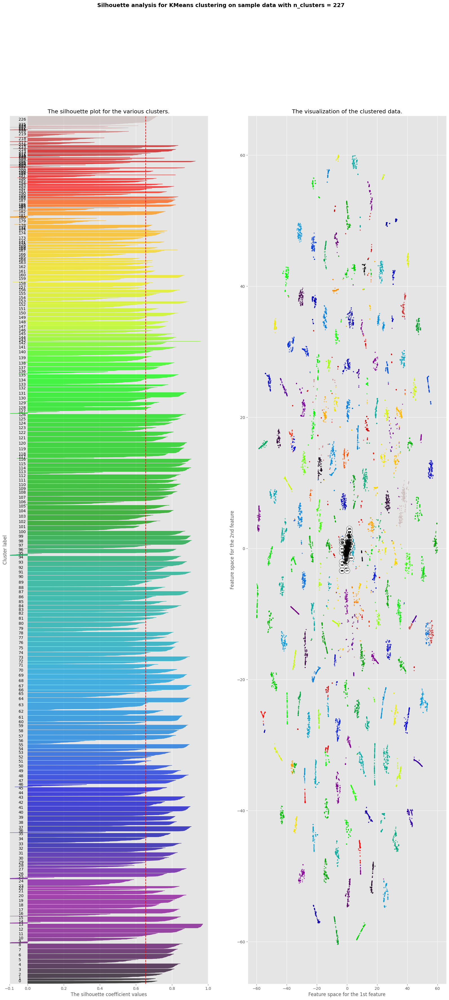

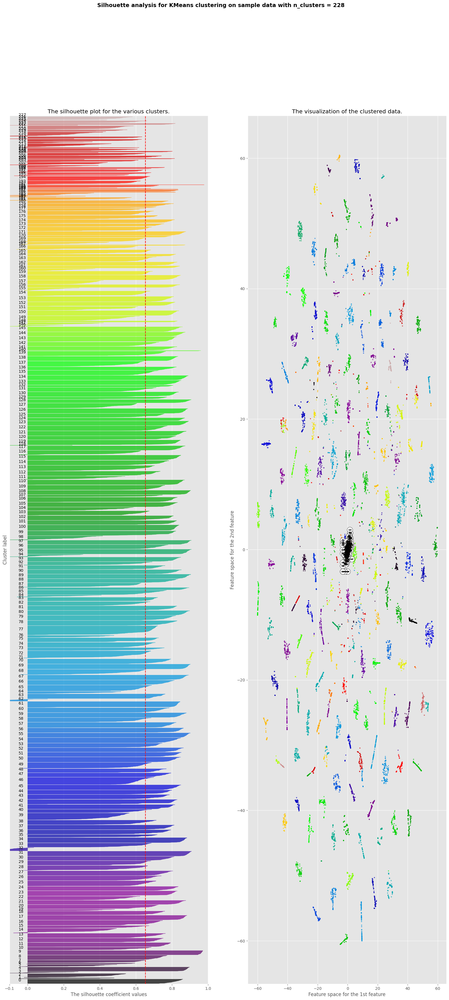

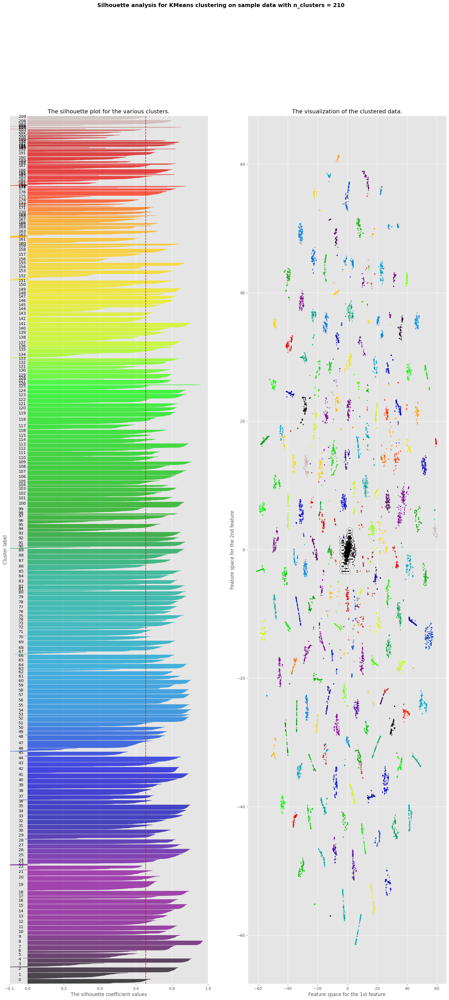

In [76]:
range_n_clusters = list(Top_Sil_Values.index)[10:20]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig,  (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(20,40)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(scaled_df) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(scaled_df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(scaled_df, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(scaled_df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    tsne = TSNE(learning_rate=50,n_components=2)
    tsne_features = tsne.fit_transform(scaled_df)

    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        tsne_features[:, 0], tsne_features[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [83]:

def Show_Clusters_Result(n_clusters):
    # Create a subplot with 1 row and 2 columns
    fig,  (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(20,40)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(scaled_df) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(scaled_df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(scaled_df, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(scaled_df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    tsne = TSNE(learning_rate=50,n_components=2)
    tsne_features = tsne.fit_transform(scaled_df)

    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        tsne_features[:, 0], tsne_features[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # # Labeling the clusters
    # centers = clusterer.cluster_centers_
    # # Draw white circles at cluster centers
    # ax2.scatter(
    #     centers[:, 0],
    #     centers[:, 1],
    #     marker="o",
    #     c="white",
    #     alpha=1,
    #     s=200,
    #     edgecolor="k",
    # )

    # for i, c in enumerate(centers):
    #     ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )
    plt.show()

For n_clusters = 194 The average silhouette_score is : 0.6555683040346948


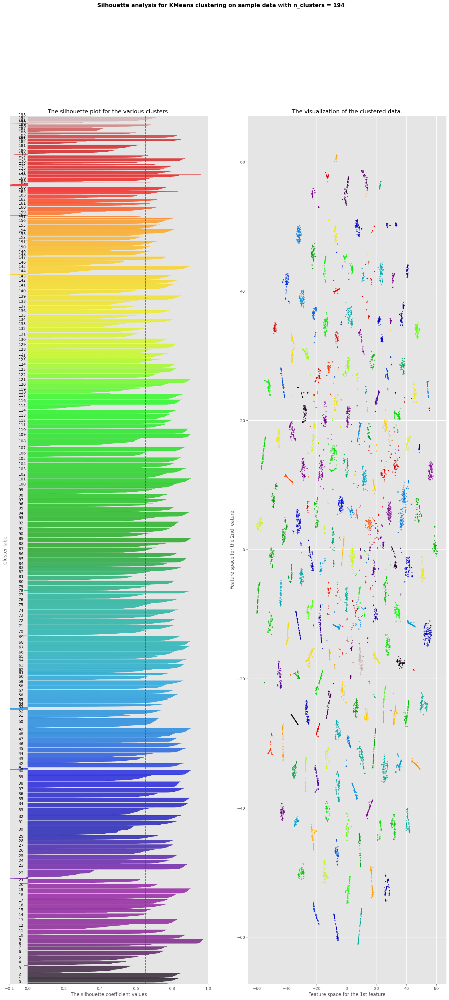

In [85]:
Show_Clusters_Result(194)

### Evaluation of Silhouette Score for k = 194

When applying the K-Means clustering algorithm with \( k = 194 \) to our dataset, the silhouette score obtained is \( 0.6555683040346948 \).

#### Interpretation:

The silhouette score of \( 0.6555683040346948 \) indicates that the clustering achieved a moderately good separation between the clusters. A silhouette score close to 1 suggests that the samples are well-clustered, while a score closer to 0 indicates overlapping clusters, and a score near -1 implies that the samples might have been assigned to the wrong clusters.

Upon visual inspection of the clustering results, it was observed that only 22 instances exhibited a situation where the distance to the nearest neighboring cluster (\( b1 \)) exceeded the mean distance to the other samples within the same cluster (\( a1 \)). This discrepancy suggests potential misclassification or overlap between neighboring clusters.

#### Explanation:

In a silhouette plot, each sample's silhouette coefficient is represented by its position relative to the neighboring clusters. The silhouette coefficient (\( s \)) is computed as the difference between the mean distance to points in the same cluster (\( a \)) and the mean distance to points in the nearest neighboring cluster (\( b \)), normalized by the maximum of \( a \) and \( b \). A positive silhouette coefficient (\( s > 0 \)) indicates that the sample is closer to points in its own cluster than to those in neighboring clusters, while a negative coefficient (\( s < 0 \)) suggests that the sample might have been assigned to the wrong cluster.

In our case, with only 22 instances where \( b1 > a1 \), it implies that there are relatively few instances where samples are closer to points in neighboring clusters than to those within their own cluster. This situation could arise due to either misclassification of samples or significant overlap between neighboring clusters, warranting further investigation into the clustering algorithm's performance and the dataset's characteristics.



In [86]:
clusterer = KMeans(n_clusters=194, random_state=10)
cluster_labels = clusterer.fit_predict(scaled_df)

In [88]:
df['cluster_labels'] = cluster_labels

In [90]:
df.sample(5)

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18,cluster_labels
3761,-59,-65,-64,-66,-65,-63,-79,-80,-68,-55,-56,-58,-67,-71,-70,-76,-71,-74,13
15464,-75,-76,-72,-69,-77,-71,-68,-54,-61,-78,-76,-77,-71,-61,-75,-75,-68,-61,113
8826,-79,-76,-75,-65,-65,-72,-64,-68,-61,-76,-83,-80,-77,-81,-79,-70,-60,-62,70
6062,-74,-69,-69,-67,-55,-53,-69,-63,-70,-73,-68,-65,-53,-63,-47,-54,-69,-69,55
9704,-65,-62,-77,-70,-54,-47,-63,-65,-62,-57,-57,-56,-53,-39,-52,-58,-59,-62,42
